In [2]:
# data cleaning and plots
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report

# sklearn classifiers

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

from sklearn import datasets, ensemble, model_selection
from sklearn.ensemble import RandomForestClassifier

from sklearn.neural_network import MLPClassifier

In [14]:
# Load data
initial_data = pd.read_csv('UNSW_NB15_training.csv')

In [4]:
# Look at the first 5 rows
initial_data.head(n=5)

,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,0.000011,2,0,496,0,90909.0902,254,0,180363632.0,0.0,...,1,2,0,0,0,1,2,0,Normal,0
1,0.000008,2,0,1762,0,125000.0003,254,0,881000000.0,0.0,...,1,2,0,0,0,1,2,0,Normal,0
2,0.000005,2,0,1068,0,200000.0051,254,0,854400000.0,0.0,...,1,3,0,0,0,1,3,0,Normal,0
3,0.000006,2,0,900,0,166666.6608,254,0,600000000.0,0.0,...,1,3,0,0,0,2,3,0,Normal,0
4,0.000010,2,0,2126,0,100000.0025,254,0,850400000.0,0.0,...,1,3,0,0,0,2,3,0,Normal,0


In [5]:
# information of the data: 583 data points, 10 features' columns and 1 target column
initial_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82332 entries, 0 to 82331
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   dur                82332 non-null  float64
 1   spkts              82332 non-null  int64  
 2   dpkts              82332 non-null  int64  
 3   sbytes             82332 non-null  int64  
 4   dbytes             82332 non-null  int64  
 5   rate               82332 non-null  float64
 6   sttl               82332 non-null  int64  
 7   dttl               82332 non-null  int64  
 8   sload              82332 non-null  float64
 9   dload              82332 non-null  float64
 10  sloss              82332 non-null  int64  
 11  dloss              82332 non-null  int64  
 12  sinpkt             82332 non-null  float64
 13  dinpkt             82332 non-null  float64
 14  sjit               82332 non-null  float64
 15  djit               82332 non-null  float64
 16  swin               823

In [6]:
# check if there are Null values
initial_data.isnull().sum()

dur                  0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat           0
label                0
dtype: int64

In [7]:
# Discard the rows with missing values
data_to_use = initial_data.dropna()

# Shape of the data: we could see that the number of rows remains the same as no null values were reported
data_to_use.shape

(82332, 41)

In [8]:
X = data_to_use.drop(axis=1, columns=['attack_cat']) # X is a dataframe
X = X.drop(axis=1, columns=['label'])


y1 = data_to_use['attack_cat'].values # y is an array
y2 = data_to_use['label'].values

In [9]:
# Calculate Y2 ratio
def data_ratio(y2):
    '''
    Calculate Y2's ratio
    '''
    unique, count = np.unique(y2, return_counts=True)
    ratio = round(count[0]/count[1], 1)
    return f'{ratio}:1 ({count[0]}/{count[1]})'

In [16]:
# Load data
test_data = pd.read_csv('UNSW_NB15_training.csv')
X_test = test_data.drop(axis=1, columns=['attack_cat']) # X_test is a dataframe
X_test = X_test.drop(axis=1, columns=['label'])


y1_test = test_data['attack_cat'].values # y is an array
y2_test = test_data['label'].values

In [17]:
X_train = X
y1_train = y1
y2_train = y2

In [18]:
# determine categorical and numerical columns
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_train.select_dtypes(include=['object', 'bool']).columns

In [19]:
numerical_cols

Index(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl',
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'],
      dtype='object')

In [20]:
categorical_cols

Index([], dtype='object')

In [21]:
# define the transformation methods for the columns
t = [('ohe', OneHotEncoder(drop='first'), categorical_cols),
    ('scale', StandardScaler(), numerical_cols)]

col_trans = ColumnTransformer(transformers=t)

# fit the transformation on training data
col_trans.fit(X_train)

ColumnTransformer(transformers=[('ohe', OneHotEncoder(drop='first'),
                                 Index([], dtype='object')),
                                ('scale', StandardScaler(),
                                 Index(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl',
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'],
      dtype='object'))])

In [22]:
X_train_transform = col_trans.transform(X_train)

In [23]:
X_test_transform = col_trans.transform(X_test)

In [24]:
# look at the transformed training data
X_train_transform.shape

(82332, 39)

In [25]:
X_test_transform.shape

(82332, 39)

In [26]:
# Note that the distinct values/labels in `y2` target are 1 and 2. 
pd.unique(y1)

array(['Normal', 'Reconnaissance', 'Backdoor', 'DoS', 'Exploits',
       'Analysis', 'Fuzzers', 'Worms', 'Shellcode', 'Generic'],
      dtype=object)

In [27]:
pd.unique(y2)

array([0, 1], dtype=int64)

In [28]:
LabelEncoder()

LabelEncoder()

In [31]:
# apply transformation method on y1_train and y1_test
y1_train_transform = target_trans.transform(y1_train)
y1_test_transform = target_trans.transform(y1_test)

In [30]:
# Define a LabelEncoder() transformation method and fit on y1_train
target_trans = LabelEncoder()
target_trans.fit(y1_train)

LabelEncoder()

In [32]:
y1_train_transform

array([6, 6, 6, ..., 6, 6, 6])

In [33]:
# Define a LabelEncoder() transformation method and fit on y2_train
target_trans = LabelEncoder()
target_trans.fit(y2_train)
y2_train_transform = target_trans.transform(y2_train)
y2_test_transform = target_trans.transform(y2_test)

In [34]:
y2_train_transform

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [35]:
# model and fit
DTclf = tree.DecisionTreeClassifier()
DTclf.fit(X_train_transform, y2_train_transform)

DecisionTreeClassifier()

In [36]:
feature_names = np.array(numerical_cols)
feature_names

array(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl',
       'dttl', 'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt',
       'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt',
       'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports'], dtype=object)

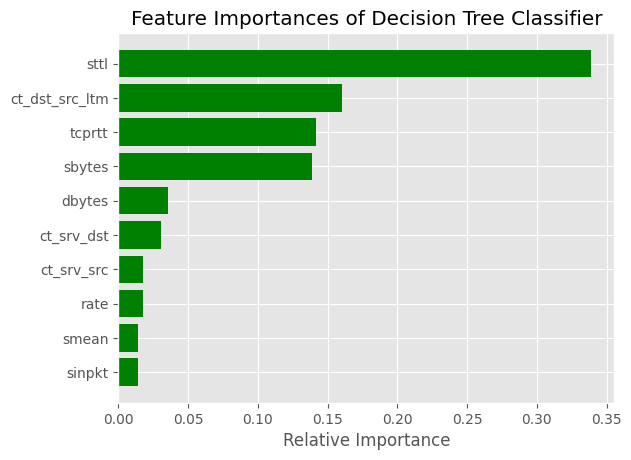

In [37]:
importances = DTclf.feature_importances_
indices = np.argsort(importances)
features = np.array(numerical_cols)
plt.title('Feature Importances of Decision Tree Classifier')
count = 10 # top # importance
plt.barh(range(count), importances[indices][len(indices)-count:], color='g', align='center')
plt.yticks(range(count), [features[i] for i in indices[len(indices)-count:]])
plt.xlabel('Relative Importance')
plt.show()

In [38]:
DTclf.feature_importances_

array([5.26234421e-03, 1.02445621e-03, 1.16471328e-03, 1.38880125e-01,
       3.57260472e-02, 1.76323849e-02, 3.38724352e-01, 0.00000000e+00,
       6.47429866e-03, 5.98958218e-03, 1.88278862e-03, 5.49706787e-04,
       1.37882901e-02, 4.05691896e-03, 2.90883651e-03, 3.13442274e-03,
       0.00000000e+00, 3.82273898e-03, 4.29716867e-03, 0.00000000e+00,
       1.41955234e-01, 6.16574352e-03, 5.02280367e-03, 1.38191364e-02,
       4.74371517e-03, 9.37981759e-04, 3.81772592e-03, 1.76955889e-02,
       2.35522482e-04, 8.65548489e-03, 6.38122447e-03, 6.24282531e-03,
       1.60166194e-01, 0.00000000e+00, 2.33872447e-05, 2.90216366e-03,
       5.50910217e-03, 3.04069911e-02, 0.00000000e+00])

In [39]:
!pip install eli5

                                              0.0/216.2 kB ? eta -:--:--
     ------------------------------------- 216.2/216.2 kB 13.7 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
                                              0.0/47.0 kB ? eta -:--:--
     ---------------------------------------- 47.0/47.0 kB ? eta 0:00:00
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107761 sha256=a083267a0870578d78176a87cf88d09371777d85ca908c871165d6090d721efb
  Stored in directory: c:\users\vansh\appdata\local\pip\cache\wheels\b8\58\ef\2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5



[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [40]:
# Create Decision Tree classifer object
DTclf = DecisionTreeClassifier(criterion="entropy", max_depth=5)

# Train Decision Tree Classifer
DTclf = DTclf.fit(X_train_transform, y2_train_transform)

#Predict the response for test dataset
y_pred = DTclf.predict(X_test_transform)

In [41]:
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y2_test_transform, y_pred))

report=metrics.classification_report(y2_test_transform,y_pred)

DTclf_name=['Decision Tree Classifer','RegLog']

print('Reporting for %s:'%DTclf_name)

print(report)

Accuracy: 0.9128406937764174
Reporting for ['Decision Tree Classifer', 'RegLog']:
              precision    recall  f1-score   support

           0       0.89      0.92      0.91     37000
           1       0.94      0.90      0.92     45332

    accuracy                           0.91     82332
   macro avg       0.91      0.91      0.91     82332
weighted avg       0.91      0.91      0.91     82332



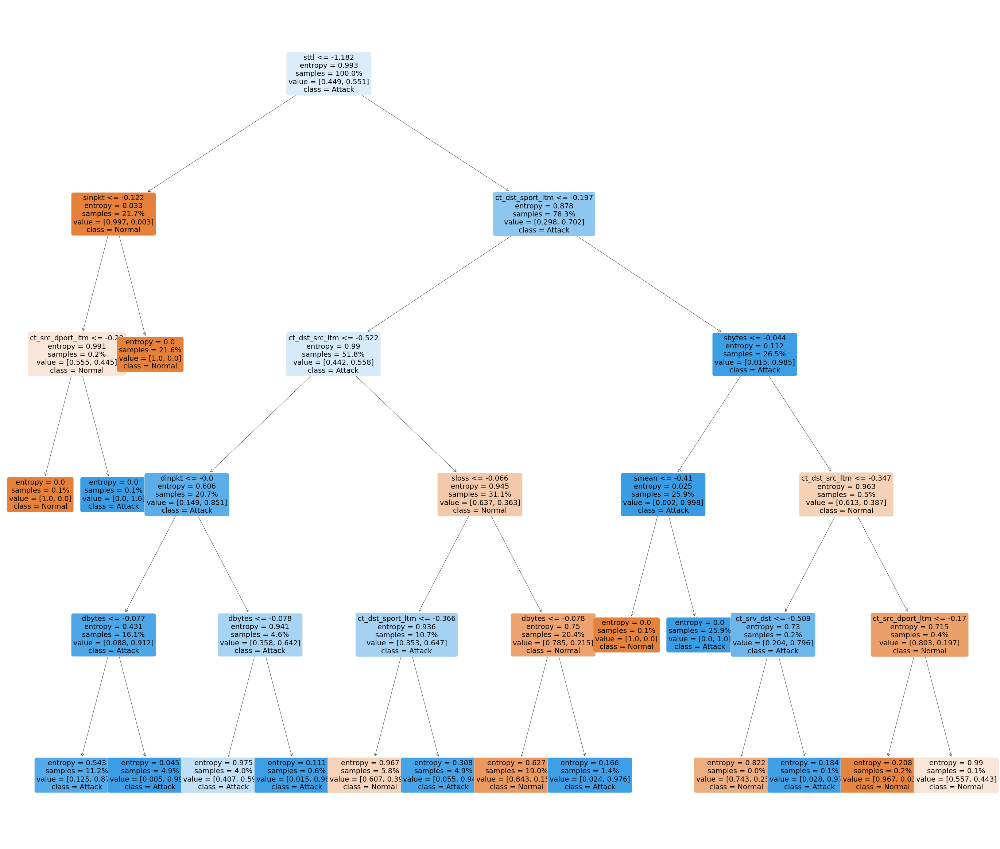

In [49]:
fig = plt.figure(figsize=(35, 30))
DTtree = tree.plot_tree(
    DTclf, 
    feature_names=numerical_cols.tolist(),  # Convert the array to a list
    class_names=['Normal', 'Attack'],
    fontsize=14,
    proportion=True,
    filled=True,
    rounded=True
)

for o in DTtree:
    arrow = o.arrow_patch


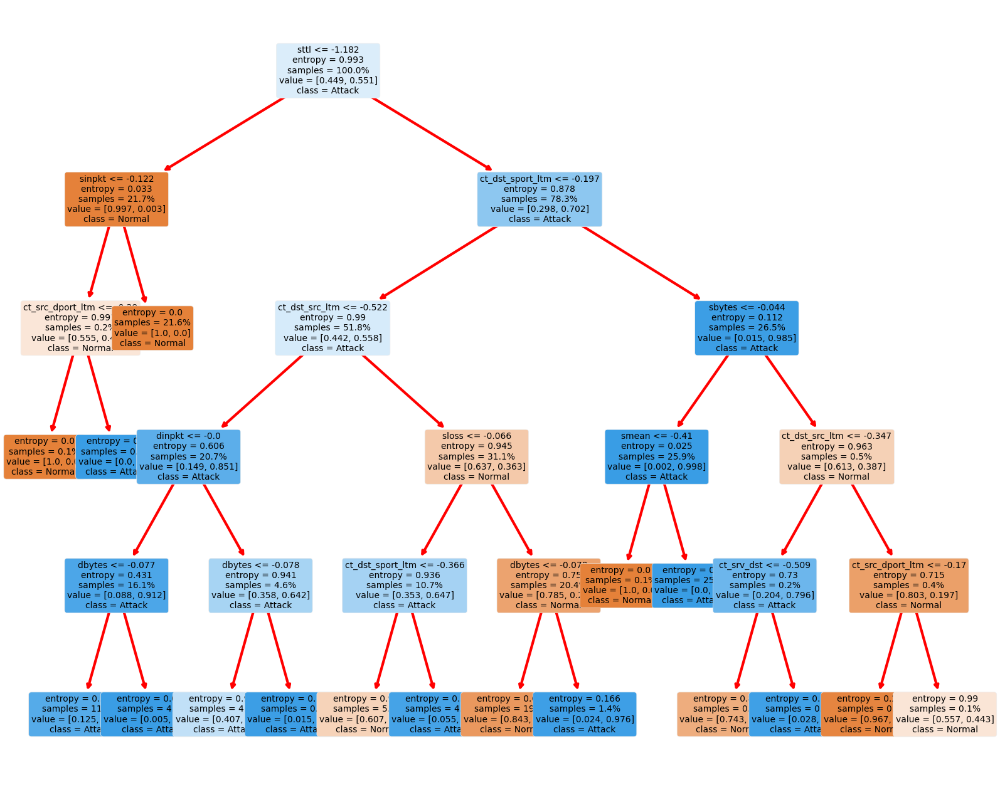

In [51]:
# visualization of DT Classfier
fig = plt.figure(figsize=(20, 16))
DTtree = tree.plot_tree(DTclf, feature_names = features.tolist(), class_names = ['Normal', 'Attack'], fontsize=10, proportion=True, filled=True, rounded=True, max_depth=8) 
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier (Depth = 8 Nodes) Explainable AI Visualization.png')

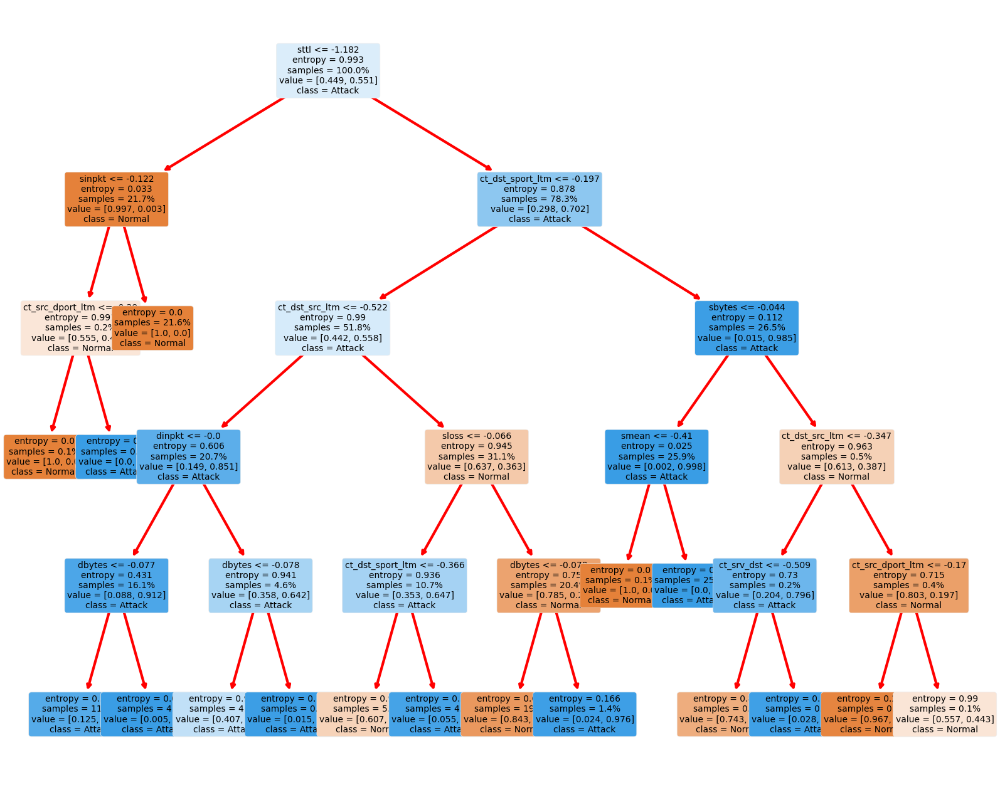

In [52]:
# visualization of DT Classfier
fig = plt.figure(figsize=(20, 16))
DTtree = tree.plot_tree(DTclf, feature_names = features.tolist(), class_names = ['Normal', 'Attack'], fontsize=10, proportion=True, filled=True, rounded=True, max_depth=8) 
for o in DTtree:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('red')
        arrow.set_linewidth(3)

fig.savefig('Decision Tree Classifier (Depth = 8 Nodes) Explainable AI Visualization.png')

In [53]:
# ===== Step 1: cross-validation ========
# define  Stratified 5-fold cross-validator, it provides train/validate indices to split data in train/validate sets.
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

DTclf = tree.DecisionTreeClassifier()

# define metrics for evaluating
scoring = ['accuracy', 'precision_micro', 'recall_micro', 'f1_micro', 'roc_auc_ovr']  

# perform the 5-fold CV and get the metrics results
cv_results = cross_validate(estimator=DTclf,
                            X=X_train_transform,
                            y=y2_train_transform,
                            scoring=scoring,
                            cv=cv,
                            return_train_score=False) # prevent to show the train scores on cv splits.

In [54]:
cv_results

{'fit_time': array([1.34580398, 1.31029439, 1.29985404, 1.32981586, 1.26237941]),
 'score_time': array([0.02000546, 0.01902509, 0.01900697, 0.02000499, 0.02100515]),
 'test_accuracy': array([0.96404931, 0.96599259, 0.96386493, 0.96556541, 0.96678003]),
 'test_precision_micro': array([0.96404931, 0.96599259, 0.96386493, 0.96556541, 0.96678003]),
 'test_recall_micro': array([0.96404931, 0.96599259, 0.96386493, 0.96556541, 0.96678003]),
 'test_f1_micro': array([0.96404931, 0.96599259, 0.96386493, 0.96556541, 0.96678003]),
 'test_roc_auc_ovr': array([0.96361496, 0.9654025 , 0.9630217 , 0.96536573, 0.96665373])}

In [55]:
cv_results['test_accuracy'].mean()

0.9652504549750761

In [59]:
# ======== Step 2: Evaluate the model using testing data =======

# fit the Logistic Regression model
DTclf.fit(X=X_train_transform, y=y2_train_transform)

# predition on testing data
y_pred_class = DTclf.predict(X=X_test_transform)
y_pred_score = DTclf.predict_proba(X=X_test_transform)[:, 1]

# AUC of ROC
auc_ontest = roc_auc_score(y_true=y2_test_transform, y_score=y_pred_score)
# confusion matrix
cm_ontest = confusion_matrix(y_true=y2_test_transform, y_pred=y_pred_class)
# precision score
precision_ontest = precision_score(y_true=y2_test_transform, y_pred=y_pred_class)
# recall score
recall_ontest = recall_score(y_true=y2_test_transform, y_pred=y_pred_class)
# classifition report
cls_report_ontest = classification_report(y_true=y2_test_transform, y_pred=y_pred_class)

# print the above results
print('The model scores {:1.5f} ROC AUC on the test set.'.format(auc_ontest))
print('The precision score on the test set: {:1.5f}'.format(precision_ontest))
print('The recall score on the test set: {:1.5f}'.format(recall_ontest))
print('Confusion Matrix:\n', cm_ontest)
# Print classification report:
print('Classification Report:\n', cls_report_ontest)

The model scores 1.00000 ROC AUC on the test set.
The precision score on the test set: 1.00000
The recall score on the test set: 0.99987
Confusion Matrix:
 [[37000     0]
 [    6 45326]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     37000
           1       1.00      1.00      1.00     45332

    accuracy                           1.00     82332
   macro avg       1.00      1.00      1.00     82332
weighted avg       1.00      1.00      1.00     82332



In [62]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [61]:
pip install lime

                                              0.0/275.7 kB ? eta -:--:--
     -------------------------------------- 275.7/275.7 kB 8.6 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
                                              0.0/78.3 kB ? eta -:--:--
     ---------------------------------------- 78.3/78.3 kB 4.3 MB/s eta 0:00:00
                                              0.0/24.5 MB ? eta -:--:--
     -                                        0.8/24.5 MB 16.3 MB/s eta 0:00:02
     --                                       1.5/24.5 MB 16.4 MB/s eta 0:00:02
     ---                                      2.4/24.5 MB 17.3 MB/s eta 0:00:02
     ------                                   4.0/24.


[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [63]:
MLP = MLPClassifier(random_state=123, solver='adam', max_iter=8000)
MLP.fit(X_train_transform, y2_train_transform)

MLPClassifier(max_iter=8000, random_state=123)

In [64]:
metrics.accuracy_score(y2_test_transform, gbtree.predict(X_test_transform))


NameError: name 'gbtree' is not defined

In [66]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Define the gradient boosting classifier
gbtree = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=1)

# Fit the classifier to your training data
gbtree.fit(X_train_transform, y2_train_transform)

# Make predictions on the testing data
y_pred = gbtree.predict(X_test_transform)

# Compute accuracy
accuracy = accuracy_score(y2_test_transform, y_pred)

# Print the accuracy
print("Accuracy:", accuracy)







Accuracy: 0.9590195792644415


In [67]:
predict_fn = lambda x: gbtree.predict_proba(x).astype(float)

In [68]:
metrics.accuracy_score(y2_test_transform, gbtree.predict(X_test_transform))

0.9590195792644415

In [69]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_transform ,feature_names = features, class_names = ['Normal', 'Attack'])

In [70]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=10)
exp.show_in_notebook(show_all=False)
print('True class: ')
if (y2_test_transform[i] == 0):
    print('Normal')
else:
    print('Attack')

True class: 
Attack


In [71]:
!pip install xgboost

                                              0.0/99.7 MB ? eta -:--:--
                                              0.5/99.7 MB 10.2 MB/s eta 0:00:10
                                              1.3/99.7 MB 14.0 MB/s eta 0:00:08
                                              2.4/99.7 MB 17.4 MB/s eta 0:00:06
     -                                        3.7/99.7 MB 19.6 MB/s eta 0:00:05
     -                                        4.9/99.7 MB 22.5 MB/s eta 0:00:05
     --                                       6.4/99.7 MB 22.8 MB/s eta 0:00:05
     ---                                      8.3/99.7 MB 25.4 MB/s eta 0:00:04
     ---                                     10.1/99.7 MB 27.0 MB/s eta 0:00:04
     ----                                    11.9/99.7 MB 32.8 MB/s eta 0:00:03
     -----                                   13.0/99.7 MB 32.8 MB/s eta 0:00:03
     -----                                   13.8/99.7 MB 31.2 MB/s eta 0:00:03
     -----                                   14.


[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [72]:
!pip install shap

                                              0.0/447.3 kB ? eta -:--:--
     -------------------------------------- 447.3/447.3 kB 9.3 MB/s eta 0:00:00
                                              0.0/2.6 MB ? eta -:--:--
     ---------------                          1.0/2.6 MB 32.0 MB/s eta 0:00:01
     ------------------------------------     2.4/2.6 MB 30.6 MB/s eta 0:00:01
     ---------------------------------------- 2.6/2.6 MB 23.8 MB/s eta 0:00:00
                                              0.0/28.1 MB ? eta -:--:--
     -                                        1.2/28.1 MB 40.0 MB/s eta 0:00:01
     ----                                     2.9/28.1 MB 37.4 MB/s eta 0:00:01
     ------                                   4.9/28.1 MB 38.7 MB/s eta 0:00:01
     ---------                                6.7/28.1 MB 38.8 MB/s eta 0:00:01
     -----------                              8.0/28.1 MB 36.5 MB/s eta 0:00:01
     ------------                             9.1/28.1 MB 34.1 MB/s


[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [73]:
from sklearn.model_selection import train_test_split
import xgboost
import shap
import numpy as np
import matplotlib.pylab as pl

In [74]:
xg_train = xgboost.DMatrix(X_train_transform, label=y2_train_transform)
xg_test = xgboost.DMatrix(X_test_transform, label=y2_test_transform)

In [75]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y2_train_transform),
    "eval_metric": "logloss"
}
model = xgboost.train(params, xg_train, 5000, evals = [(xg_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.68021
[100]	test-logloss:0.29577
[200]	test-logloss:0.18456
[300]	test-logloss:0.14064
[400]	test-logloss:0.11765
[500]	test-logloss:0.10125
[600]	test-logloss:0.09044
[700]	test-logloss:0.08253
[800]	test-logloss:0.07619
[900]	test-logloss:0.07143
[1000]	test-logloss:0.06729
[1100]	test-logloss:0.06397
[1200]	test-logloss:0.06110
[1300]	test-logloss:0.05865
[1400]	test-logloss:0.05627
[1500]	test-logloss:0.05420
[1600]	test-logloss:0.05237
[1700]	test-logloss:0.05046
[1800]	test-logloss:0.04880
[1900]	test-logloss:0.04723
[2000]	test-logloss:0.04572
[2100]	test-logloss:0.04430
[2200]	test-logloss:0.04300
[2300]	test-logloss:0.04169
[2400]	test-logloss:0.04055
[2500]	test-logloss:0.03941
[2600]	test-logloss:0.03836
[2700]	test-logloss:0.03735
[2800]	test-logloss:0.03634
[2900]	test-logloss:0.03534
[3000]	test-logloss:0.03441
[3100]	test-logloss:0.03355
[3200]	test-logloss:0.03275
[3300]	test-logloss:0.03197
[3400]	test-logloss:0.03115
[3500]	test-logloss:0.03037
[360

In [76]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer = shap.TreeExplainer(model)
shap_values_test = explainer.shap_values(X_test)

[17:07:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


In [77]:
# print the JS visualization code to the notebook
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values_test[5,:], X_test.iloc[5,:])

In [78]:
y2_test[5]

0

In [79]:
shap.force_plot(explainer.expected_value, shap_values_test[:1000,:], X_test.iloc[:1000,:])

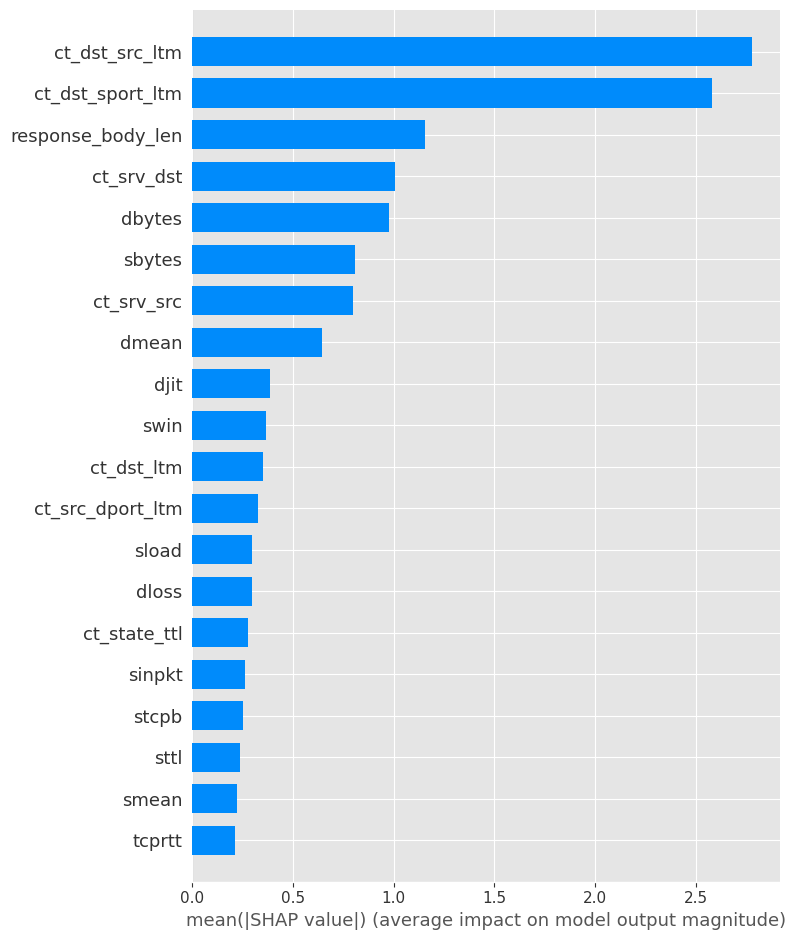

In [80]:
shap.summary_plot(shap_values_test, X_test, plot_type="bar")

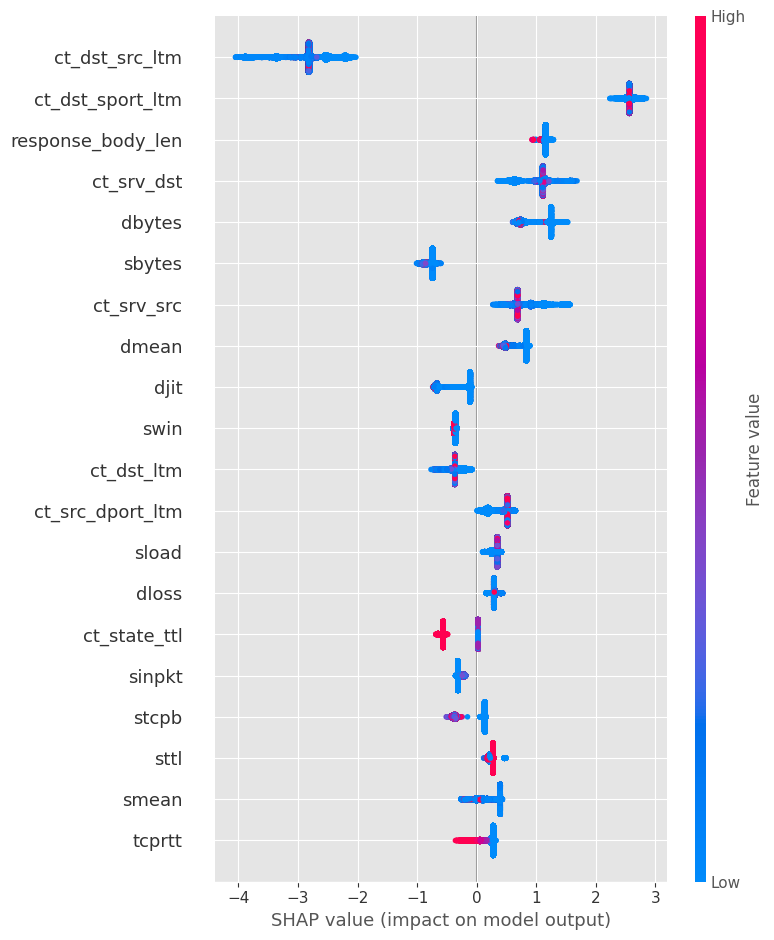

In [81]:
shap.summary_plot(shap_values_test, X_test)

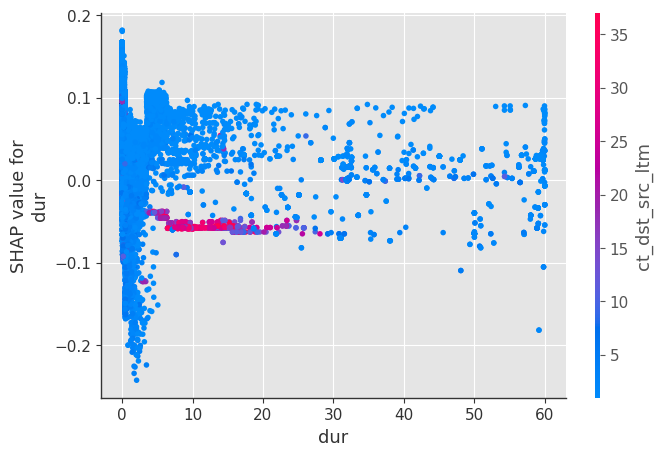

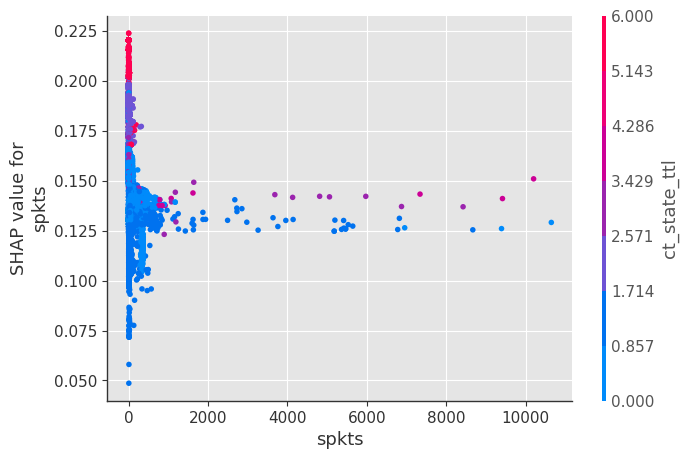

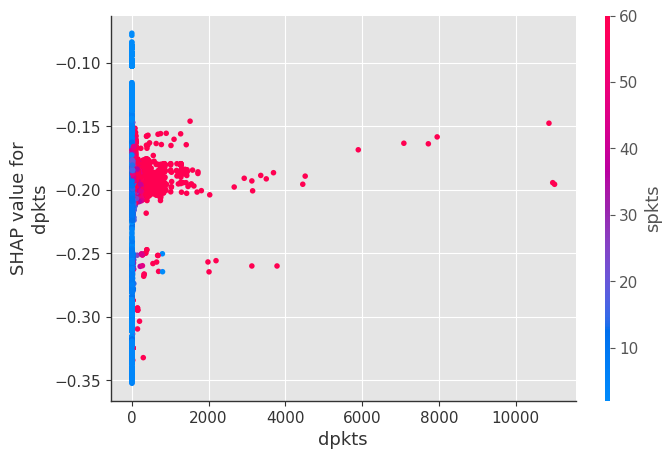

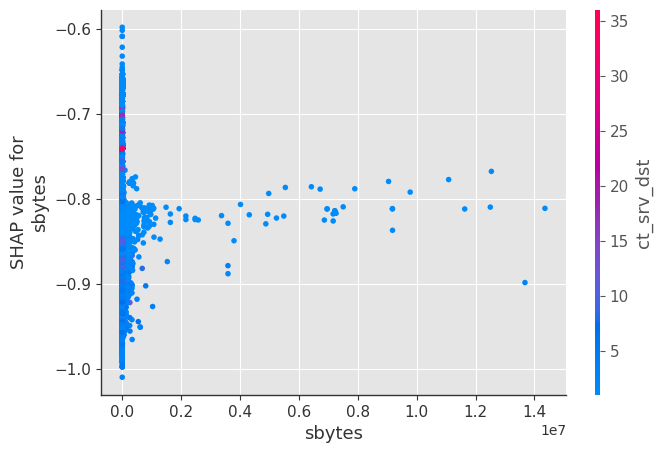

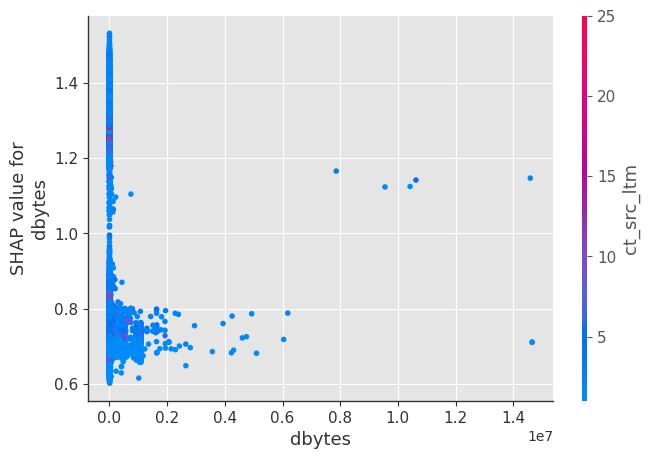

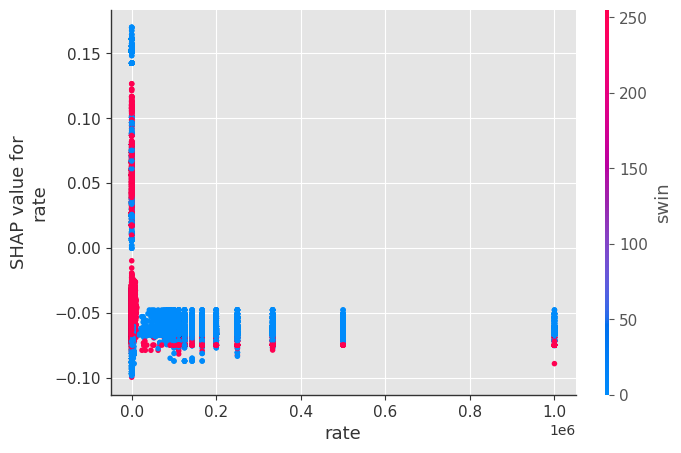

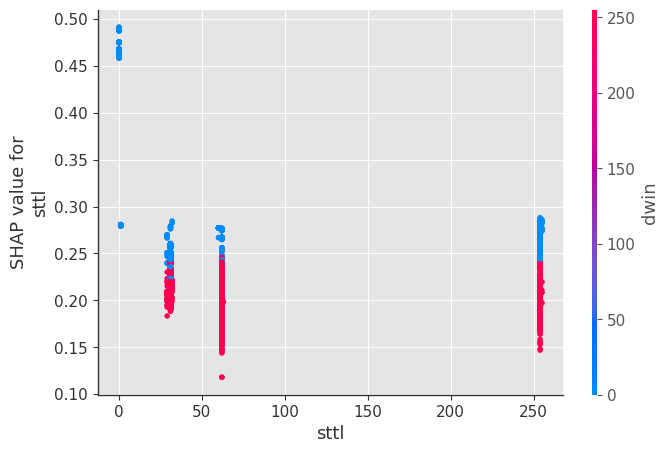

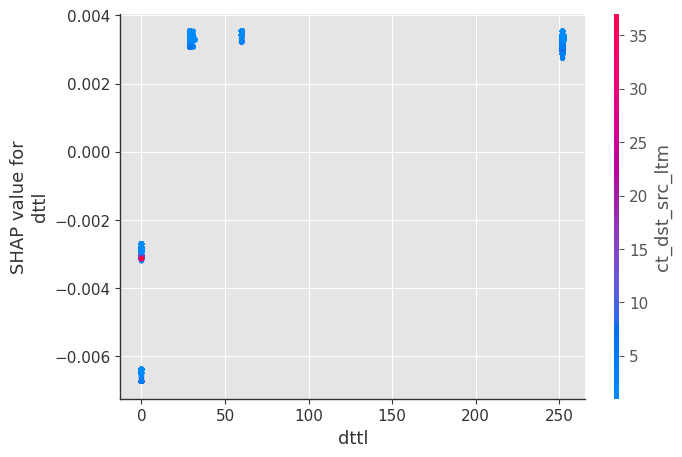

invalid value encountered in divide
invalid value encountered in divide


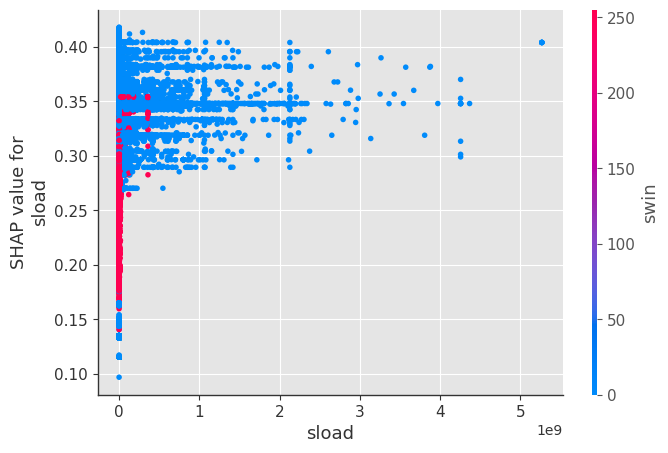

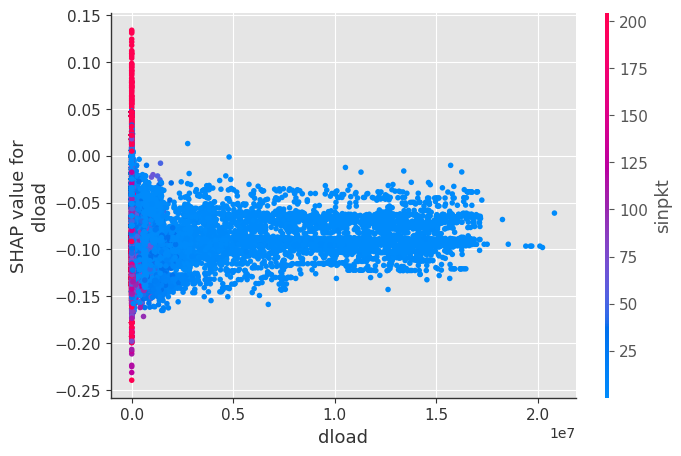

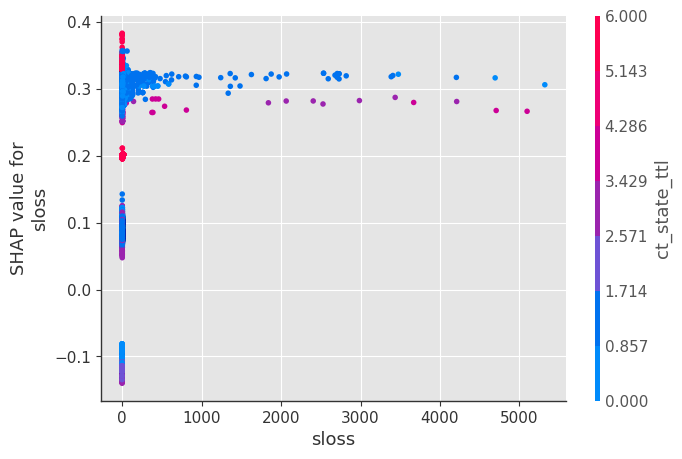

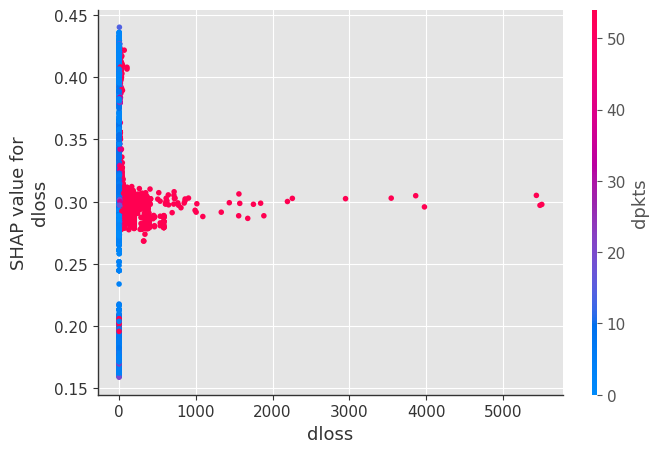

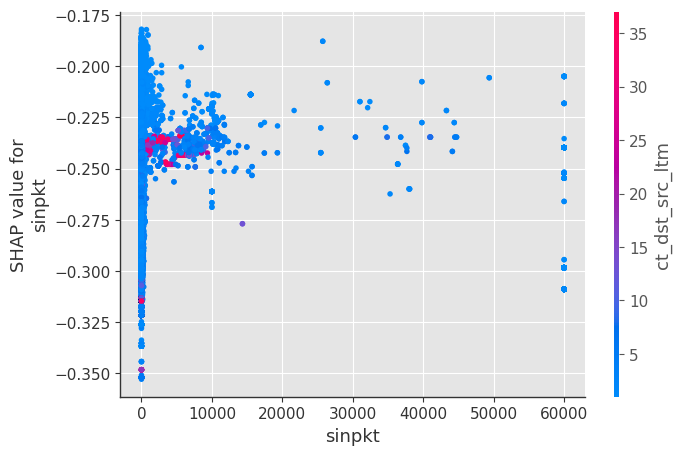

...

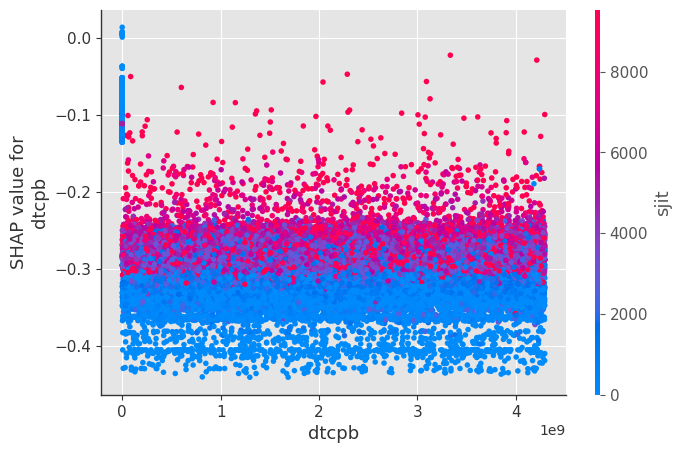

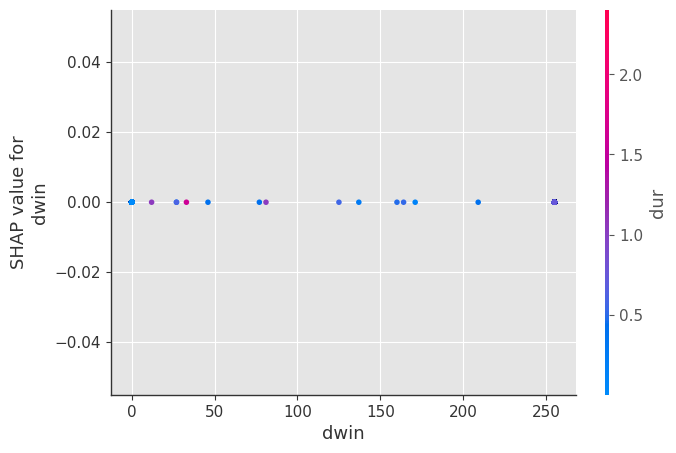

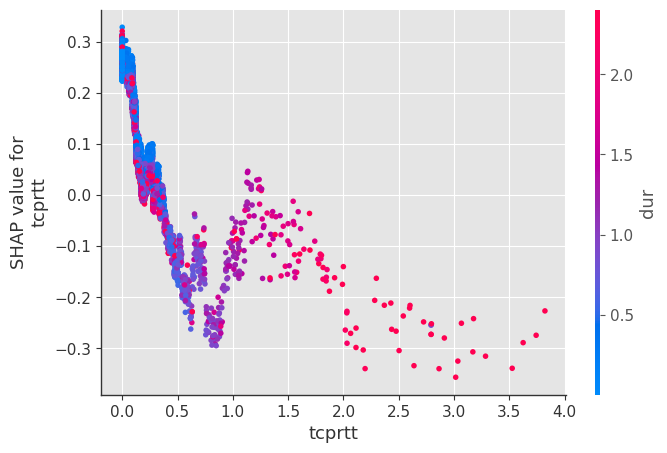

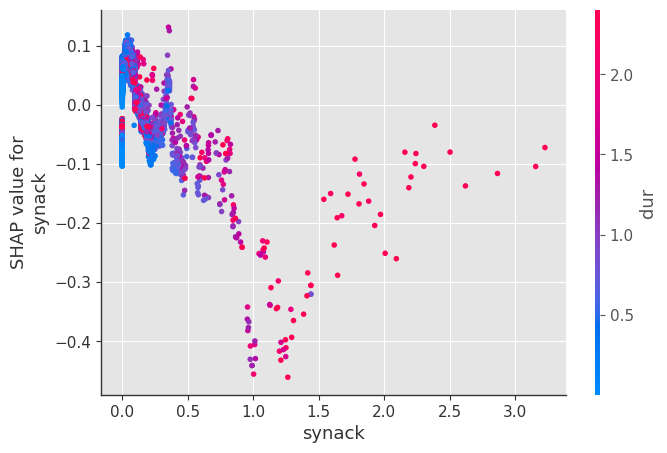

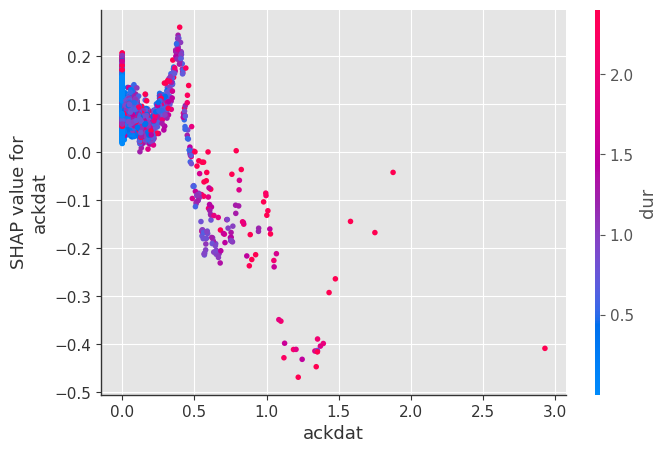

invalid value encountered in divide
invalid value encountered in divide


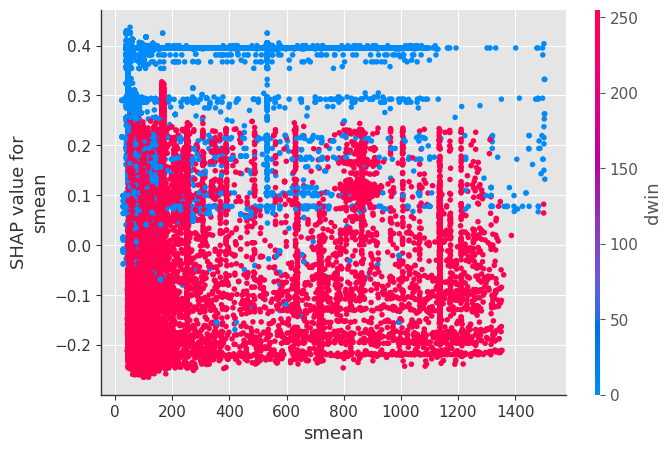

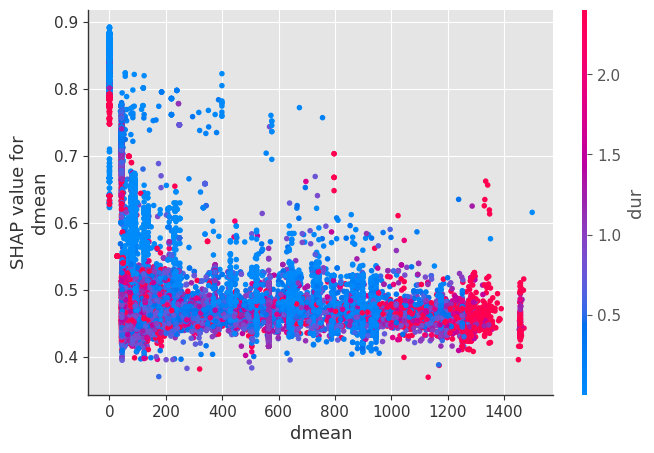

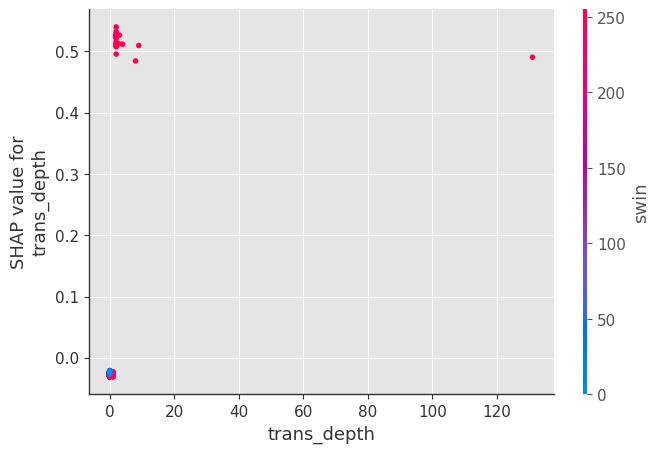

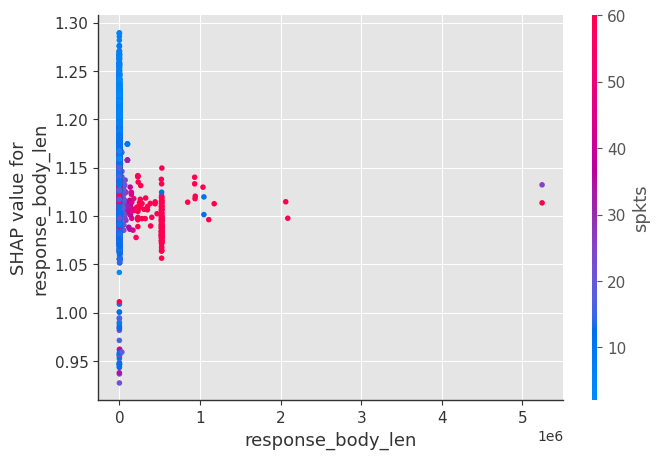

invalid value encountered in divide
invalid value encountered in divide


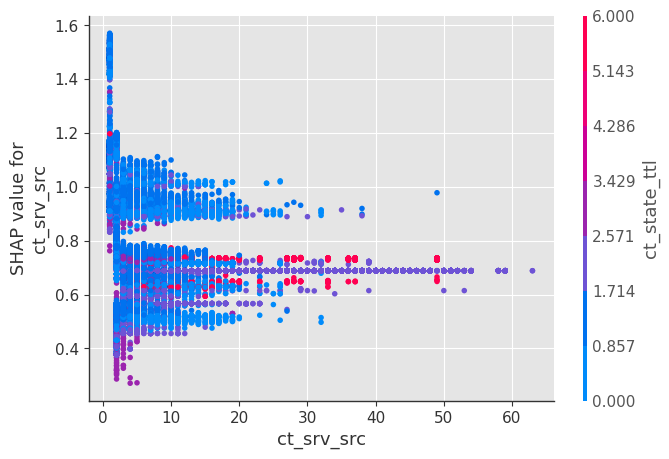

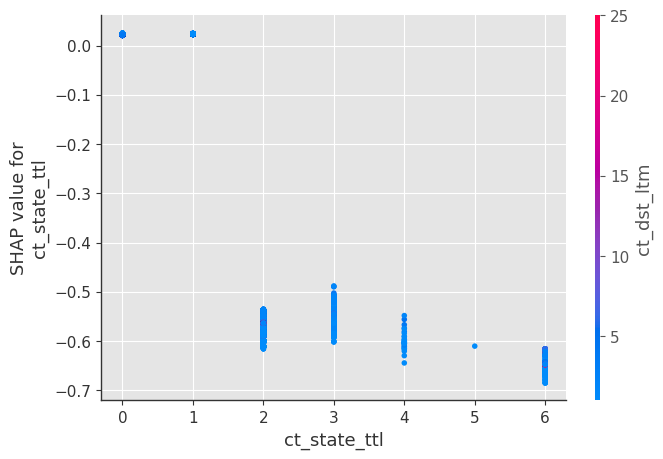

invalid value encountered in divide
invalid value encountered in divide


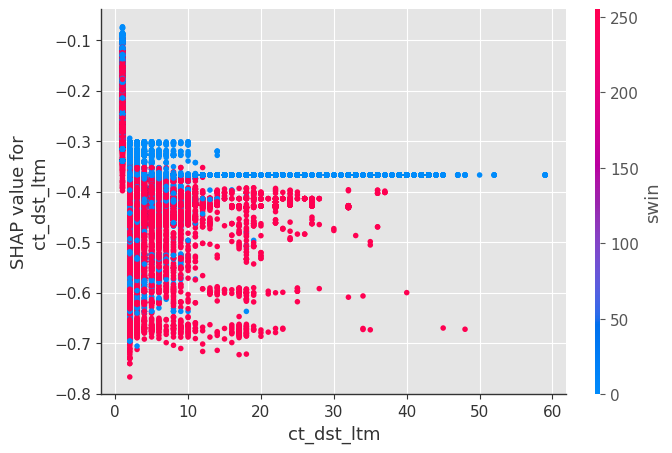

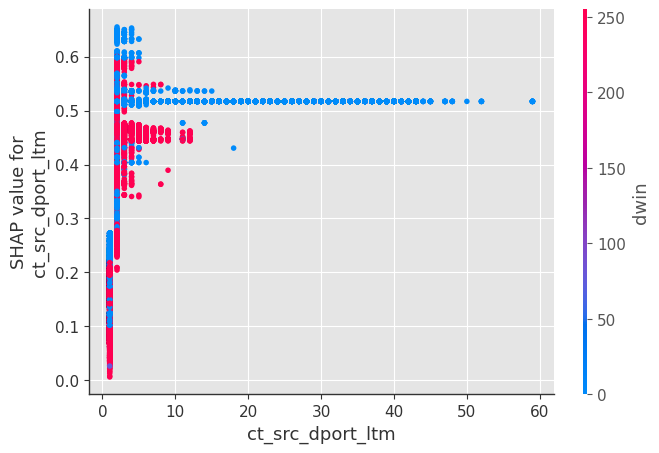

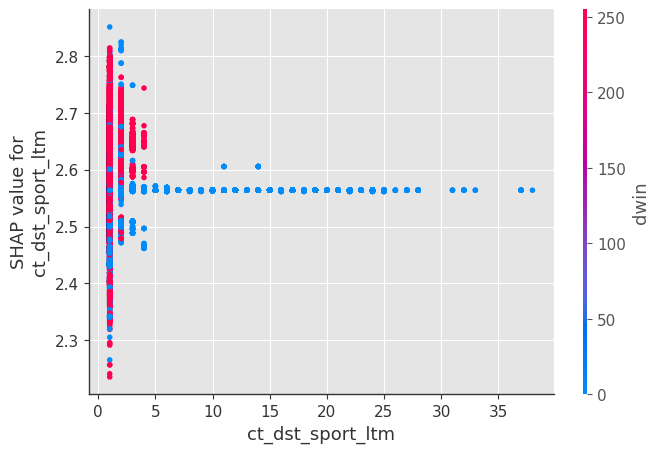

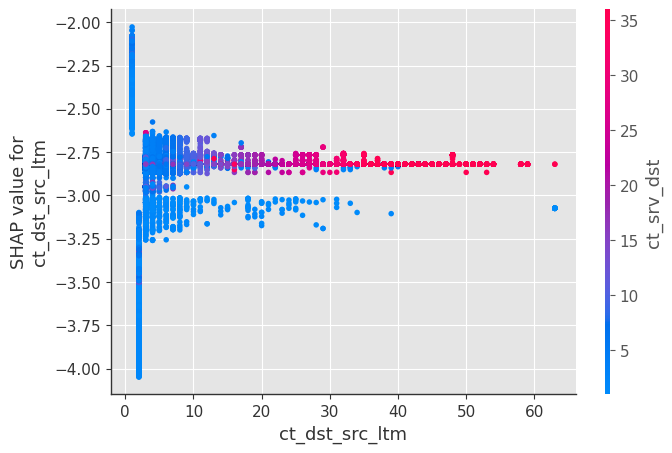

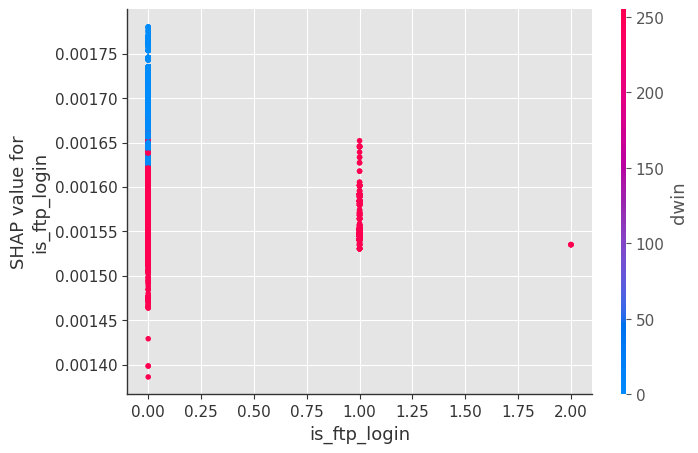

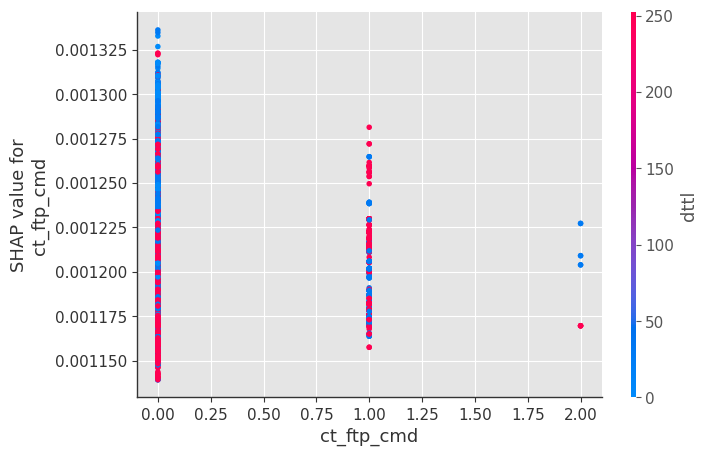

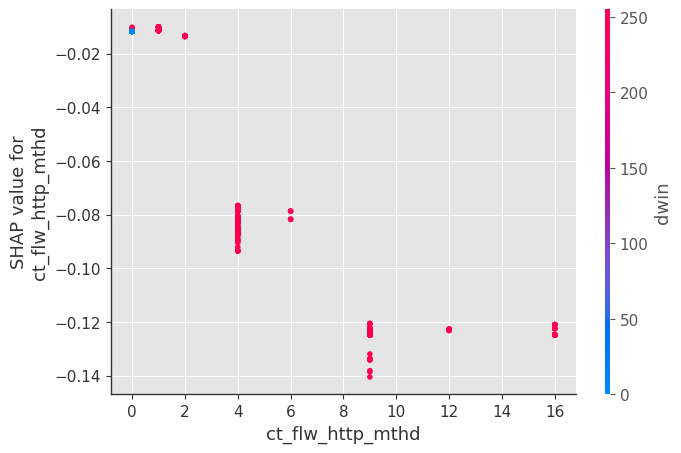

invalid value encountered in divide
invalid value encountered in divide


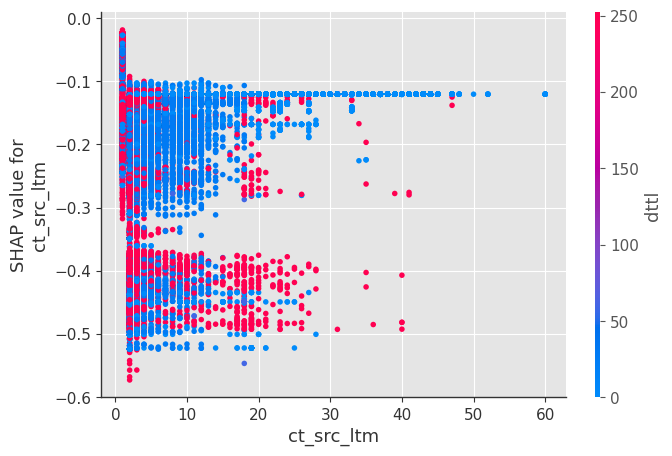

invalid value encountered in divide
invalid value encountered in divide


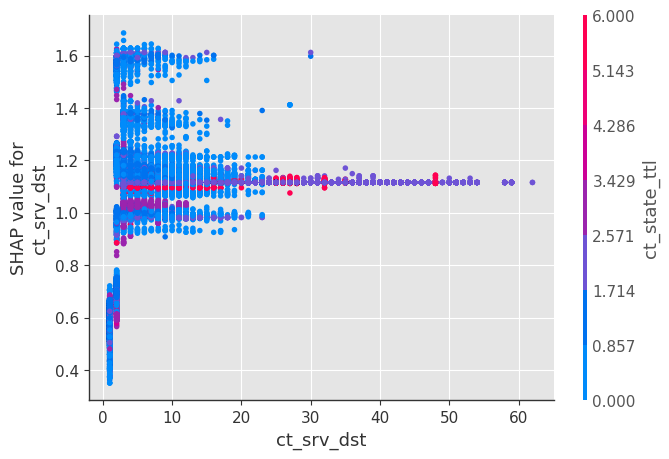

invalid value encountered in divide
invalid value encountered in divide


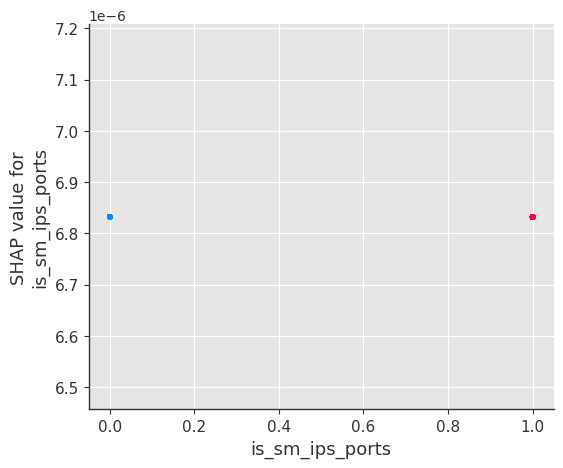

In [82]:
for name in X_test.columns:
    shap.dependence_plot(name, shap_values_test, X_test, display_features=X_test)

In [83]:
# takes a couple minutes since SHAP interaction values take a factor of 2 * # features
# more time than SHAP values to compute, since this is just an example we only explain
# the first 2,000 people in order to run quicker
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X_test.iloc[:2000,:])

[17:16:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0cec3277c4d9d0165-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


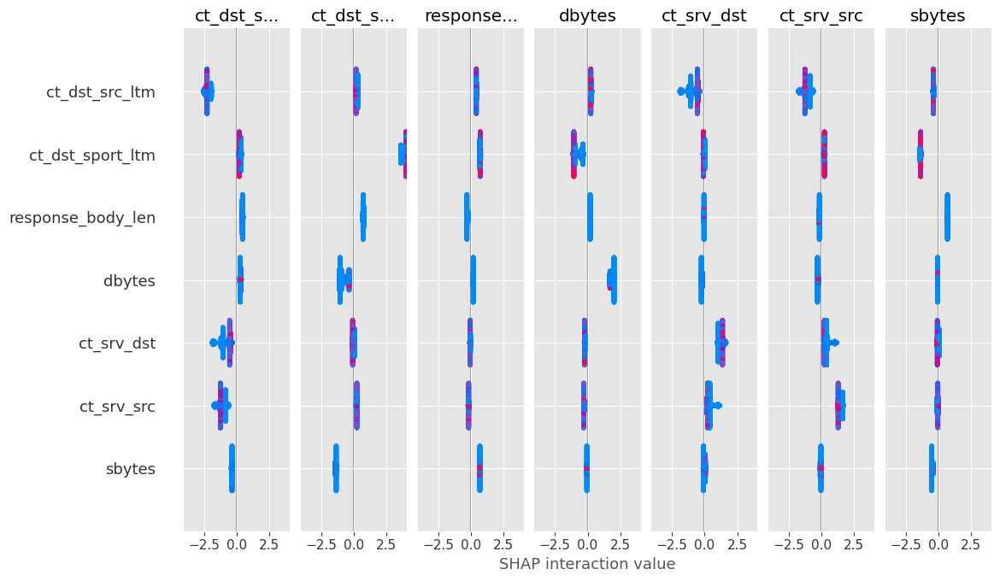

In [84]:
shap.summary_plot(shap_interaction_values, X_test.iloc[:2000,:])

In [85]:
!pip install lime


[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [86]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [87]:
import xgboost
gbtree = xgboost.XGBClassifier(n_estimators=300, max_depth=5)
gbtree.fit(X_train_transform, y2_train_transform)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [88]:
metrics.accuracy_score(y2_test_transform, gbtree.predict(X_test_transform))

0.994862264975951

In [89]:
predict_fn = lambda x: gbtree.predict_proba(x).astype(float)

In [2]:
features = np.array(numerical_cols)
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_transform ,feature_names = features, class_names = ['Normal', 'Attack'])

NameError: name 'np' is not defined

In [92]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

In [1]:
i = 10
exp = explainer.explain_instance(X_test_transform[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

NameError: name 'explainer' is not defined